# Исследование заведений общественного питания в Москве

**Цель исследования:**  подготовить исследование рынка Москвы, найти интересные особенности,
которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания.
    

**Имеющиеся данные:** датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер

**План работы:**

- изучение общей информации;
- предообработка данных;
- анализ объектов общественного питания для выявления закономерностей;
- анализ кофеен;
- выводы.

### Изучение общей информации

Импортируем все необходимые библиотеки, сохраним датасет в переменную, изучим общий вид и информацию по таблице. Сохраним в отдельную переменную информацию о размере исходного датасета, для контроля количества сохраненных данных после этапа предобработки.

In [69]:
# импортируем необходимые библиотеки
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import plotly.express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from numpy import median
# подключаем модуль для работы с JSON-форматом
import json
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()

In [70]:
#сохраняем данные,выводим первые 5 строк
places = pd.read_csv('/datasets/moscow_places.csv')
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [71]:
# проверим информацию о количестве, типе данных и пропусках.
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Сохраним исходный размер датасета в переменную для дальнейшего контроля количества данных.

In [72]:
places_start = places.shape
places_start

(8406, 14)

В данных представлены: наименования заведений, категория, адрес, координаты, часы работы, рейтинг, информация о ценах, относится ли заведение к сетевым и сколько в нем мест. 
Всего представлена информация по 8406 заведениям.
В данных есть пропущенные значения, которые нужно изучить на этапе предообработки данных. Информация о ценах представлена менее чем у половины заведений. 
Наименования колонок и типы данных указаны корректно. 

### Предообработка данных

Проверим пропуски, дубликаты, внесем корректировки в типы данных, добавим отдельные столбцы с названиями улиц и обозначением заведений, которые работают ежедневно и круглосуточно.

In [73]:
# проверим наличие явных дубликатов
places.duplicated().sum()

0

Явных полных дубликатов в данных нет. Проверим наличие дубликатов по наименованию заведения и адресу.

In [74]:
places[['name','address']].duplicated().sum()

0

In [75]:
places[['name', 'lat', 'lng']].duplicated().sum()

0

In [76]:
#уникальные наименования категорий
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [77]:
#уникальные наименования районов
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [78]:
#уникальные наименования chain
places['chain'].unique()

array([0, 1])

Дубликатов и аномальных значений в данных нет.

Проверим данные в колонках с числовыми значениями.

In [79]:
places['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Минимальное значение рейтинга - 1, максимальное  - 5. Аномальных значений нет.

In [80]:
places['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Минимальное число мест - 0, максимальное  - 1288. Нужно проверить данные в процессе анализа.

In [81]:
places['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Минимальный средний счет - 0, средний счет - 958 рублей, максимальный счет - 35000. Данные о максимальном счете выглядят аномально.

In [82]:
places['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Минимальный средний счет чашки капучино - 60, средний счет - 174 рубля, максимальный счет - 1568. Данные о максимальном счете за чашку капучино выглядят аномально.

Проверим количество пропусков в данных.

In [83]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В данных большое количество пропусков в информации о ценах, и количестве мест. Также не у всех заведений указаны часы работы. 
Пропуски в данных о ценах и количестве мест заменять не будем, так как их нет возможности корректно заменить на средние значения.
Заменим пропуски в указании часов работы заведения на "неизвестно".

In [84]:
# замена пропусков в часах работы 
places['hours'] = places['hours'].fillna('неизвестно')
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Извлечем в отдельный столбец наименования улиц из столбца с адресом.

In [85]:
# разделяем адрес на элементы с разделителем ","
places['street'] = places['address'].str.split(',').str[1].str.strip()
places[['address','street']].head(10)

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица
5,"Москва, Ижорская улица, вл8Б",Ижорская улица
6,"Москва, Клязьминская улица, 9, стр. 3",Клязьминская улица
7,"Москва, Клязьминская улица, 9, стр. 3",Клязьминская улица
8,"Москва, Дмитровское шоссе, 107, корп. 4",Дмитровское шоссе
9,"Москва, Ангарская улица, 39",Ангарская улица


Создаем отдельный столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [86]:
# создаем новый столбец с результатами проверки часов работы заведений и подсчитываем число значений
places['is_24_7'] = places['hours'].isin(['ежедневно, круглосуточно'])
places['is_24_7'].value_counts()

False    7676
True      730
Name: is_24_7, dtype: int64

Из 8406 заведений только 730 (8,68%) работают ежедневно и круглосуточно.

**Вывод:**

Была проведена предобработка данных:

- дубликатов в данных нет;
- в данных о средних ценах есть аномально высокие максимальные значения, нужно учесть при анализе данных.
- большое число пропусков в данных о ценах и количестве мест в заведениях, что вероятно связано с добавлением этих данных пользователями самостоятельно. 
- заменены пропуски в часах работы заведения на "неизвестно"
- добавлены колонки: с наименованиями улиц и обозначением, что заведение работает ежедневно и круглосуточно (24/7).

Данные готовы для дальнейшего анализа.

### Анализ данных

Проведем анализ рынка общепита в Москве, изучим распределение заведений по категориям, количеству мест, рейтингам, типам заведений. Отобразим результаты на графиках.

#### Распределение заведений по категориям.

Исследуем количество объектов общественного питания по категориям. Построим визуализации.

In [87]:
# считаем колиество записей в разбивке по категориям
places_category = places['category'].value_counts().reset_index()
places_category

,index,category
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


В Москве представлены следующие категории заведений: кафе, ресторан, кофейня, бар(паб), пиццерия, быстрое питание, столовая, булочная. Наибольшее число заведений в категориях кафе - 2378 и ресторан - 2043, наименьшее в категориях столовая - 315 и булочная - 256. 

Построим визуализацию распределения заведений по категорим в процентах от общего числа заведений. 

In [88]:
#строим столбчатую диаграмму 
fig = px.bar(places_category, x="index", y="category", text='category',
             labels={"index": "Категория заведений", "category": "Количество заведений"})
fig.update_layout(title='Количество заведений по категориям', # указываем заголовок графика
                  width=1000, # указываем размеры графика
                  height=500)
      
fig.show() # выводи6м график

In [89]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=places_category['index'], # указываем значения, которые появятся на метках сегментов
                             values=places_category['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])

fig.show() # выводим график

Больше половины от общего числа заведений в Москве - 52,6% приходятся на кафе (28,3%) и рестораны (24,3%). На третьем месте кофейни с долей 16,8%. Наименьшую долю рынка занимают столовые (3,75%) и булочные (3,05%).

#### Распределение количества посадочных мест по категориям.


Исследуем количество посадочных мест в заведениях по категориям и построим визуализации.

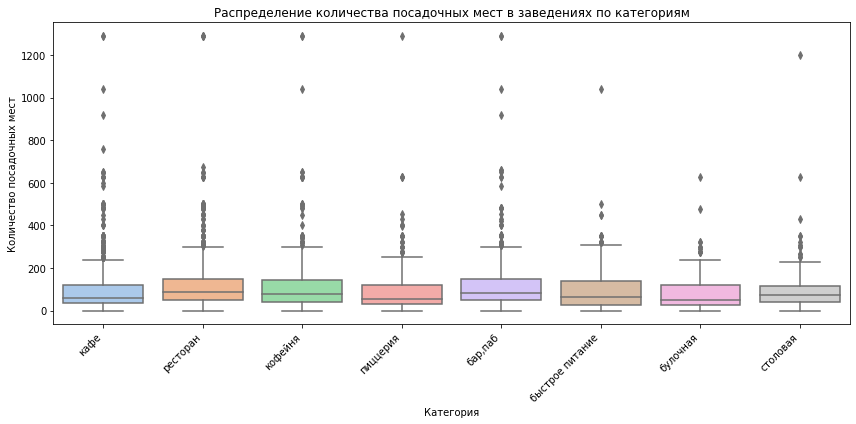

In [90]:
# задаем размер графика
plt.figure(figsize=(12, 6))
#строим график "ящик с усами"
sns.boxplot(x='category', y='seats', data=places, palette='pastel')
# задаем подписи и параметры отображения графика
plt.title('Распределение количества посадочных мест в заведениях по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

По графику видно, что в среднем на заведение приходится не больше 100 мест. На графике видны выбросы, заведения с аномально большим числом посадочных мест. Посчитаем количество данных с числом мест больше 400.

In [91]:
#размер выобрки с числом мест больше 400
places[places['seats'] > 400].shape

(121, 16)

121 заведение имеет количество посадочных мест большее 400, что составляет 2,5% от общего числа заведений с указаным количеством посадочных мест. 

In [92]:
#отобразим данные о заведениях с числом мест больше 400
places[places['seats'] > 400].sort_values(by='seats', ascending = False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0,проспект Вернадского,False
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,проспект Вернадского,False
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0,проспект Вернадского,False
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,неизвестно,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,неизвестно,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7740,"Ресторан, кафе, бар","бар,паб","Москва, Чертановская улица, 40, корп. 1",Южный административный округ,неизвестно,55.613435,37.591537,4.1,NaN,NaN,NaN,NaN,0,428.0,Чертановская улица,False
7594,Хочу шашлык,столовая,"Москва, Чертановская улица, 47, корп. 1",Южный административный округ,"ежедневно, 08:00–23:55",55.604430,37.590782,4.4,NaN,NaN,NaN,NaN,1,428.0,Чертановская улица,False
6975,Додо Пицца,пиццерия,"Москва, Чертановская улица, 12, корп. 1",Южный административный округ,"ежедневно, 10:00–23:00",55.629974,37.599094,4.7,NaN,Средний счёт:301 ₽,301.0,NaN,1,428.0,Чертановская улица,False
7761,Pratto Pizza,ресторан,"Москва, Чертановская улица, 40, корп. 1",Южный административный округ,"ежедневно, круглосуточно",55.613326,37.591377,3.3,NaN,NaN,NaN,NaN,0,428.0,Чертановская улица,True


В данных есть дублирующиеся адреса с разными названиями заведений и одинаковым числом мест. Есть данные с дублирующимся колиечтсвом мест в разных заведених. Вероятнее всего есть ошибки в данных, технические и человеский фактор. Так как данных немного, их лучше удалить для дальнейшего анализа. 

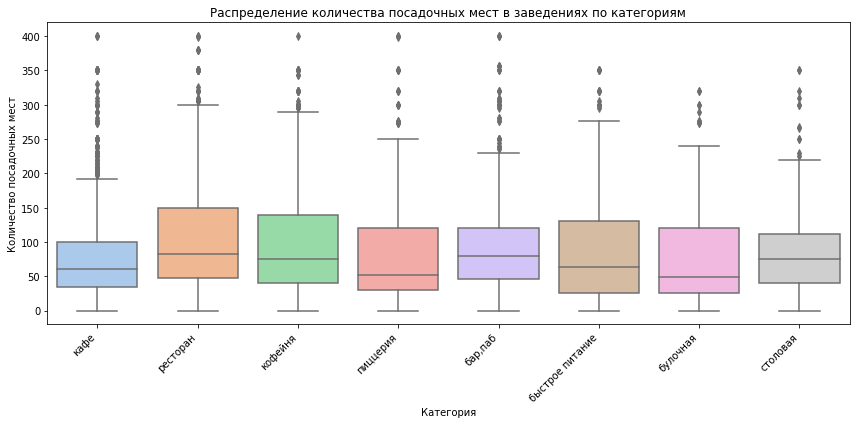

In [93]:
# убираем из данных заведения с числом мест больше 400
places = places[(places['seats'] <= 400) | (places['seats'].isna())]
# задаем размер графика
plt.figure(figsize=(12, 6))

#строим график "ящик с усами"
sns.boxplot(x='category', y='seats', data=places, palette='pastel')

# задаем подписи и параметры отображения графика
plt.title('Распределение количества посадочных мест в заведениях по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Проверям размер датасета.

In [94]:
places.shape

(8285, 16)

Посчитаем медианное значение количества мест по категориям заведений.

In [95]:
places.groupby('category').agg({'seats':'median'})

,seats
category,
"бар,паб",80.0
булочная,49.5
быстрое питание,64.0
кафе,60.0
кофейня,75.0
пиццерия,52.0
ресторан,83.0
столовая,75.0


Провели анализ количества посадочных мест по категориям. Удалили данные о заведениях с количеством посадочных мест больше 400, так как данные значения явяляются аномальными, а в данных вероятно допущены ошибки. Сохранено более 98% от первоначального объема данных, что позволяет продолжить дальнейший анализ. 

Наибольшее медианное число посадочных мест в категориях ресторан - 83 места, бар,паб - 80 мест, столовая и кофейня - по 75 мест. Наименьшее медианное число посадочных мест в пиццериях - 52 места и булочных - 49,5 мест. 

#### Распределение сетевых и несетевых заведений.

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [96]:
#группируем данные по колонке chain, считаем число сетевых и несетвых заведений
group_chain = places.groupby('chain').size().reset_index(name='count')
#меняем значение 0 на несетевое и 1 на сетевое
group_chain['chain'] = group_chain['chain'].replace({0:'несетевое',1:'сетевое'})
group_chain

,chain,count
0,несетевое,5131
1,сетевое,3154


In [97]:
fig = px.bar(group_chain, # загружаем данные 
             x='count', # указываем столбец с данными для оси X
             y='chain', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве заведений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение сетевых и несетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения',
                   width=600, # указываем размеры графика
                   height=400)
fig.show() # выводим график

В Москве большее количество несетевых заведений - 5131, сетевых заведений - 3154. Далее рассмотрим какие категорий заведений чаще явлются сетевыми.

#### Распределение заведений по категориям и типам.

Изучим какие категории заведений чаще являются сетевыми и построим визуализацию.

In [98]:
# Группировка данных по 'category' и 'chain' и подсчет количества записей в каждой группе
places_category_chain = places.groupby(['category', 'chain']).size().reset_index(name='count')

# Замена значений в столбце 'chain'
places_category_chain['chain'] = places_category_chain['chain'].replace({0: 'несетевое', 1: 'сетевое'})

# вывод результата
places_category_chain

,category,chain,count
0,"бар,паб",несетевое,580
1,"бар,паб",сетевое,167
2,булочная,несетевое,99
3,булочная,сетевое,155
4,быстрое питание,несетевое,368
5,быстрое питание,сетевое,231
6,кафе,несетевое,1582
7,кафе,сетевое,766
8,кофейня,несетевое,685
9,кофейня,сетевое,709


In [99]:
# Получаем уникальные категории
unique_categories = places_category_chain['category'].unique()

# Создаем subplot с 3 рядами и по 2 столбца в каждом ряду
rows = (len(unique_categories) + 1) // 2
fig = make_subplots(
    rows=rows, cols=2, subplot_titles=[f'Категория: {category}' for category in unique_categories],
    specs=[[{'type': 'domain'}, {'type': 'domain'}] for _ in range(rows)]
)

# Добавляем круговые диаграммы в subplot
for i, category in enumerate(unique_categories):
    row = (i // 2) + 1
    col = (i % 2) + 1
    category_data = places_category_chain[places_category_chain['category'] == category]
    fig.add_trace(go.Pie(labels=category_data['chain'], values=category_data['count']), row=row, col=col)

# Устанавливаем общий заголовок для всех диаграмм
fig.update_layout(title_text="Распределение заведений по категориям и типам", title_x=0.5, height = 800, width = 600)

# Отображаем график
fig.show()

Чаще всего сетевыми заведениями являются булочные - 61%. Кофейни и пиццерии распределились почти пополам 50,9% кофеен и 52,2% пиццерий являются сетевыми. Реже всего сетевыми бывают бары,пабы (доля сетевых заведений 22,4 %) и столовые (доля сетевых заведений 27,6 %)

#### Топ-15 популярных сетей в Москве.

Найдем топ-15 наиболее популярных сетевых заведений в Москве по числу заведений и построим визуализации. 

In [100]:
#создаем датасет только с сетевыми заведениями
places_chain = places[places['chain'] == 1]
#проверяем размер датасета.
places_chain.shape

(3154, 16)

In [101]:
#группируем данные понаименованию, считаем размер
places_chain_grouped = places_chain.groupby('name').size().reset_index()
#меняем названия колонок
places_chain_grouped.columns = ['name','count']
#сортируем по убыванию числа заведений
places_chain_grouped = places_chain_grouped.sort_values(by = 'count', ascending = False).head(15)
places_chain_grouped

,name,count
745,Шоколадница,117
343,Домино'с Пицца,76
339,Додо Пицца,73
147,One Price Coffee,70
758,Яндекс Лавка,68
58,Cofix,65
169,Prime,48
678,Хинкальная,44
377,КОФЕПОРТ,42
430,Кулинарная лавка братьев Караваевых,38


In [102]:
# строим столбчатую диаграмму 
fig = px.bar(places_chain_grouped.sort_values(by = 'count', ascending = True), # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование')
fig.show() # выводим график

Наиболее популярными сетями являются федеральные сети - Шоколадница, Домино'с Пицца и Додо Пицца. 
Посмотрим категории заведений из топ-15 сетей Москвы

In [103]:
#объеденим с таблицей Place по наименованию и добавим категорию заведения
places_chain_grouped_category = places_chain_grouped.merge(places[['name', 'category']], on = 'name', how = 'left').drop_duplicates()
places_chain_grouped_category

,name,count,category
0,Шоколадница,117,кофейня
7,Шоколадница,117,кафе
117,Домино'с Пицца,76,пиццерия
193,Додо Пицца,73,пиццерия
266,One Price Coffee,70,кофейня
336,Яндекс Лавка,68,ресторан
404,Cofix,65,кофейня
469,Prime,48,ресторан
506,Prime,48,кафе
517,Хинкальная,44,быстрое питание


Как видно в одной сети могут быть разные категории заведений. Это может быть связано как с разынми форматами заведений, так и с ошибками в данных.

С большим отрывом по количеству заведений выигрывает Шоколадница - 117 заведений, у Домино-с Пиццы и Додо Пиццы - 76 и 73 заведения соответственно. Большинство сетей из рейтинга являются федеральными. 
Наименьшее число заведений из топ-15 сетей Москвы у Буханки - 32 заведения и Му-Му - 26 заведений. Данные сети представлены только в Москве и области. 

Также можно отметить, что большинство популярных сетевых заведений являются заведениями достаточно быстрого питания и не расссчитаны на долгое время пребывания посетителей. 

#### Распределение заведений по районам.

Отобразите общее количество заведений и количество заведений каждой категории в распределении по районам.

In [104]:
# Группируем данные по району и категории и подсчитываем количество заведений
places_category_district = places.groupby(['district', 'category']).size().reset_index()
places_category_district.columns = ['district','category','count']
#считаем общее число заведений в районе
district_totals = places_category_district.groupby('district')['count'].sum().reset_index()
district_totals.columns = ['district', 'total_count']
#объединяем данные.
places_category_district = places_category_district.merge(district_totals, on='district')
places_category_district = places_category_district.sort_values(by=['total_count', 'count'], ascending=False)

In [105]:
#строим столбчатую диаграмму 
fig = px.bar(places_category_district, x="district", y="count", color="category", 
             labels={"count": "Количество заведений", "district": "Район", "category": "Категория"})
#Подписывыем общее количество заведений
for district in district_totals['district']:
    total_count = district_totals[district_totals['district'] == district]['total_count'].values[0]
    fig.add_annotation(x=district, y=total_count, text=f'Всего: {total_count}', showarrow=False, yshift=10)
             
fig.show() # выводим график

Наибольшее число заведений в Центральном АО - 2206, далее идут Северо-Восточный АО - 888 и Северный АО - 877. Наименьшее число заведений в Северо-Западном АО - 409. Распределение заведений по категориям во всех районах совпадает с распределением по датасету в целом. Больше всего ресторанов, кафе и кофеен. Меньше всего - булочных и столовых. 

Количество заведений в центре города значительно превышает окраины, что объяснимо большим числом туристов и офисов в центре города.

####  Распределение средних рейтингов по категориям заведений.

Визуализируем распределение средних рейтингов по категориям заведений.

In [106]:
places['rating'].describe()

count    8285.000000
mean        4.229342
std         0.472168
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Среднее значения рейтинга по всем заведениям - 4,22. Посмотрим разницу в рейтингах по категориям заведений.

In [107]:
#группируем данные по категориям, считаем средний рейтинг
places_category_rating = places.groupby('category').agg({'rating':'mean'}).reset_index()
places_category_rating

,category,rating
0,"бар,паб",4.389290
1,булочная,4.267323
2,быстрое питание,4.049750
3,кафе,4.122956
4,кофейня,4.277475
5,пиццерия,4.301276
6,ресторан,4.290070
7,столовая,4.211218


In [108]:
#строим столбчатую диаграмму.
fig = px.bar(places_category_rating.sort_values(by='rating'), x="category", y="rating", text='rating') # добавляем аргумент, который отобразит текст с информацией
                                
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Категория заведения',
                   yaxis_title='Средний рейтинг')
fig.update_traces(texttemplate='%{text:.2f}', textposition='inside')
fig.update_yaxes(range=[3, 5], dtick=0.2)

fig.show() # выводим график

Наиболее высокий средний рейтинг у категории бар, паб - 4,39. Самый низкий рейтинг у категории быстрое питание - 4,05. В целом разница в средних рейтингах между категориями не слишком большая и находится около среднего рейтинга заведений в целом - 4,22.

#### Картограмма  со средним рейтингом заведений каждого района.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [109]:
#группируем данные по району и рейтингу
places_district_rating = places.groupby('district',as_index=False)['rating'].agg('mean')
places_district_rating

,district,rating
0,Восточный административный округ,4.173731
1,Западный административный округ,4.179854
2,Северный административный округ,4.238997
3,Северо-Восточный административный округ,4.148649
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377244
6,Юго-Восточный административный округ,4.100842
7,Юго-Западный административный округ,4.172869
8,Южный административный округ,4.185160


In [110]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [111]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_ch = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=places_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_ch)

# выводим карту
m_ch

Наиболее высокие рейтинги у заведений в Центральном АО, следом идут Северный и Северно-Западный районы. Хуже всего рейтинги у заведений в Юго-Восточном АО.

#### Отображение кластеров заведений на карте.

Отобразим все заведения датасета на карте с помощью кластеров.

In [112]:
# создаём карту Москвы
m_cl = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_cl)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m_cl

На карте наглядно видно как распределены заведения по районам Москвы. Наибольшая концентрация заведений приходится на Центральную часть Москвы, наименьшая на Юго-Восточную. 

#### Топ-15 улиц по количеству заведений.

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [113]:
#считаем количтсво заведений по улицам и отбираем 15 самых популярных улиц.
top_15 = places['street'].value_counts().sort_values(ascending = False).head(15).index
top_15

Index(['проспект Мира', 'Профсоюзная улица', 'Ленинский проспект',
       'проспект Вернадского', 'Дмитровское шоссе', 'Каширское шоссе',
       'Варшавское шоссе', 'Ленинградский проспект', 'Ленинградское шоссе',
       'МКАД', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект',
       'Пятницкая улица', 'Алтуфьевское шоссе'],
      dtype='object')

In [114]:
#отбираем данные по топ-15 улиц
places_top_15 = places[places['street'].isin(top_15)]
#группируем данные по улице и категории
places_street_grouped = places_top_15.groupby(['street','category'], as_index = False).size()

# считаем общее количество заведений для каждой улицы
street_totals = places_top_15['street'].value_counts().reset_index()
street_totals.columns = ['street', 'total_count']

# объединяем данные по категориям с общими данными
places_street_grouped = places_street_grouped.merge(street_totals, on='street')

# сортируем  данные по общему количеству заведений
places_street_grouped = places_street_grouped.sort_values(by='total_count', ascending=False)


In [115]:
# строим график
fig = px.bar(places_street_grouped, x='street', y='size', color='category', 
             labels={'size': 'Количество заведений', 'street': 'Улица', 'category': 'Категория'},
             title='Распределение количества заведений и их категорий по топ-15 улицам')

# добавляем текст с общим числом заведений на график
for street in street_totals['street']:
    total_count = street_totals[street_totals['street'] == street]['total_count'].values[0]
    fig.add_annotation(x=street, y=total_count, text= f'{total_count}', showarrow=False, yshift=10, xshift=-10)

# оформление графика
fig.update_layout(xaxis_title='Улица', yaxis_title='Количество заведений', barmode='stack')
fig.show()

Наиболее популярная улица - проспект Мира, на нем находятся 184 заведения, из которых 53 кафе, 45 ресторанов и 36 кофеен. Далее идут Профсоюзная улица - 122 заведения и Ленинский проспект - 101 заведение. Самые популярные улицы находятся в Центральной и Юго-Западной частях Москвы.

#### Улицы с одним объектом общепита.

Найдем улицы только с одним объектом общепита  отразим на карте.

In [116]:
# считаем число заведений 
street_counts = places['street'].value_counts().reset_index()
#отбираем  улицы с одним заведением
street_1 = street_counts[street_counts['street'] == 1]['index']
#отбираем данные по улицам с одним заведением
places_street_1 = places[places['street'].isin(street_1)]
places_street_1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


В Москве достаточно большое число улиц только с одним заведение - 459. Отобразим заведения на карте Москвы.

In [117]:
# создаём карту Москвы
m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster_1= MarkerCluster().add_to(m_1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_1)

# применяем функцию create_clusters() к каждой строке датафрейма
places_street_1.apply(create_clusters, axis=1)

# выводим карту
m_1

Посмотрим средние рейтинги заведений.

In [118]:
#группируем данные и считаем средний рейтинг
places_street_1.groupby('district').agg({'name':'count', 'rating':'mean'}).sort_values(by = 'name', ascending = False)

,name,rating
district,,
Центральный административный округ,145,4.422759
Северо-Восточный административный округ,55,4.158182
Восточный административный округ,52,4.144231
Северный административный округ,52,4.244231
Южный административный округ,43,4.090698
Юго-Восточный административный округ,40,4.117500
Западный административный округ,35,4.048571
Северо-Западный административный округ,19,4.278947
Юго-Западный административный округ,18,4.150000


In [119]:
places_street_1['rating'].describe()

count    459.000000
mean       4.236383
std        0.461492
min        1.000000
25%        4.100000
50%        4.300000
75%        4.500000
max        5.000000
Name: rating, dtype: float64

В Москве 459 улиц, на которых находится только одно заведение общепита. Это не основные улица, дворовые, внутри жилых массивов и переулоков. Средний рейтинг таких заведений совпадает со средний рейтингом всех заведений датасета в целом - 4,23.

#### Картограмма с медианным чеком заведений каждого района.

Посчитаем медианный чек заведений по районам города и построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [120]:
#группируем данные по району и считаем медианный чек
places_bill = places.groupby('district', as_index = False).agg({'middle_avg_bill':'median'})
places_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [121]:
# создаём карту Москвы
m_b = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=places_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m_b)


# выводим карту
m_b

Наиболее высокий медианный чек в Центральном и Западном АО - 1000 руб. Наиболее низкий чек в Северо-Восточном, Южном и Юго-Восточном АО - 450-500 рублей.

#### Вывод.

По результатам проведенного анализа заведений Москвы выявлено:
- больше половины от общего числа заведений в Москве - 52,6% приходятся на кафе (38,3%) и рестораны (24,3%). На третьем месте кофейни с долей 16,8%. Наименьшую долю рынка занимают столовые (3,75%) и булочные (3,05%).
- наибольшее медианное число посадочных мест в категориях ресторан - 83 места, бар,паб - 80 мест, столовая и кофейня - по 75 мест. Наименьшее медианное число посадочных мест в пиццериях - 52 места и булочных - 49,5 мест. 
-большее количество заведений являются несетевыми - 5131, сетевых заведений - 3154. Чаще всего сетевыми заведениями являются булочные - 61%. Также 50,9% кофеен и 52,2% пиццерий являются сетевыми. Реже всего сетевыми бывают бары,пабы (доля сетевых заведений 22,4 %) и столовые (доля сетевых заведений 27,6 %).
- наиболее популярными сетевыми заведениями являются федеральные сети Шоколадница - 117 заведений, у Домино-с Пиццы и Додо Пиццы - 76 и 73 заведения.
- наибольшее число заведений в Центральном АО - 2206, далее идут Северо-Восточный АО - 888 и Северный АО - 877. Наименьшее число заведений в Северо-Западном АО - 409. Распределение заведений по категориям во всех районах совпадает с распределением по датасету в целом. Больше всего ресторанов, кафе и кофеен. Меньше всего - булочных и столовых. 
- средний рейтинг заведений в целом - 4,22.Наиболее высокий средний рейтинг у категории бра, паб - 4,39. Самый низкий рейтинг у категории быстрое питание - 4,05. Наиболее высокие рейтинги у заведений в Центральном АО, следом идут Северный и Северно-Западный районы. Хуже всего рейтинги у заведений в Юго-Восточном АО.
- наиболее популярная улица - проспект Мира, на нем находятся 184 заведения, из которых 53 кафе, 45 ресторанов и 36 кофеен. Далее идут Профсоюзная улица - 122 заведения и Ленинский проспект - 101 заведение. Самые популярные улицы находятся в Центральной и Юго-Западной частях Москвы.
-наиболее высокий медианный чек в Центральном и Западном АО - 1000 руб. Наиболее низкий чек в Северо-Восточном, Южном и Юго-Восточном АО - 450-500 рублей.

### Исследование кофеен в Москве.

С целью открытия кофейни в Москве, детализируем исследование, проведем анализ кофеен. Изучим количество кофеен, их долю, расположение, рейтинги, среднюю стоимость чашки капучино. Сделаем выводы и дадим рекомендации.

#### Общее число кофеен, их расположение.

Изучим общее количество кофеен, их расположение и особенности размещения. Построим визуализации. 

In [122]:
# отберем из общих данных данные только по кофейням
places_coffee = places[places['category'] == 'кофейня']
places_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1394 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1394 non-null   object 
 1   category           1394 non-null   object 
 2   address            1394 non-null   object 
 3   district           1394 non-null   object 
 4   hours              1394 non-null   object 
 5   lat                1394 non-null   float64
 6   lng                1394 non-null   float64
 7   rating             1394 non-null   float64
 8   price              470 non-null    object 
 9   avg_bill           710 non-null    object 
 10  middle_avg_bill    196 non-null    float64
 11  middle_coffee_cup  514 non-null    float64
 12  chain              1394 non-null   int64  
 13  seats              732 non-null    float64
 14  street             1394 non-null   object 
 15  is_24_7            1394 non-null   bool   
dtypes: bool(1), float64(6), 

Общее число кофеен в датасете -  1394 шт. 

Изучим распределение кофеен по районам. 

In [123]:
#посчитаем число значений по районам
places_coffee_district = places_coffee['district'].value_counts().reset_index()
#переименовываем колонки
places_coffee_district.columns = ['district','count_coffee']
places_coffee_district

,district,count_coffee
0,Центральный административный округ,423
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,130
5,Восточный административный округ,104
6,Юго-Западный административный округ,95
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Строим круговую диаграмму для наглядности.

In [124]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=places_coffee_district['district'], # указываем значения, которые появятся на метках сегментов
                             values=places_coffee_district['count_coffee'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение кофеен по районам', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])
fig.show() # выводим график

Наибольшее число кофеен от общего количества - 30,3% находится в Центральном АО. Далее идет Северный АО (13,3%) и Северо-Восточный АО (11,4%). Наименьшее число кофеен от общего количества в Юго-Восточном АО (6,38%) и Северо-Западном АО (4,45%)

Проанализируем данные по каждому району и найдем какую долю занимают кофейни от общего количества заведений общепита в районе. 

In [125]:
#добавим в данные о кофейнях по районам данные об общем количестве заведений в районе
places_coffee_district = places_coffee_district.merge(district_totals, on = 'district', how = 'left')
places_coffee_district

,district,count_coffee,total_count
0,Центральный административный округ,423,2206
1,Северный административный округ,186,877
2,Северо-Восточный административный округ,159,888
3,Западный административный округ,146,824
4,Южный административный округ,130,876
5,Восточный административный округ,104,788
6,Юго-Западный административный округ,95,704
7,Юго-Восточный административный округ,89,713
8,Северо-Западный административный округ,62,409


In [126]:
# добавим столбец с долей кофеен от общего числа заведений
places_coffee_district['per_of_total'] = (places_coffee_district['count_coffee']/places_coffee_district['total_count'] * 100).round(2)
# сортируем по доле заведений и выводим на экран
places_coffee_district.sort_values(by = 'per_of_total')

,district,count_coffee,total_count,per_of_total
7,Юго-Восточный административный округ,89,713,12.48
5,Восточный административный округ,104,788,13.20
6,Юго-Западный административный округ,95,704,13.49
4,Южный административный округ,130,876,14.84
8,Северо-Западный административный округ,62,409,15.16
3,Западный административный округ,146,824,17.72
2,Северо-Восточный административный округ,159,888,17.91
0,Центральный административный округ,423,2206,19.17
1,Северный административный округ,186,877,21.21


Построим визуализацию для сравнения районов. 

In [127]:
#строим столбчатую диаграмму 
fig = px.bar(places_coffee_district.sort_values(by = 'per_of_total'), x = 'district', y = 'per_of_total',
       text=places_coffee_district.sort_values(by = 'per_of_total').apply(lambda row: f"{row['per_of_total']}%, от {row['total_count']}", axis=1))
#добавляем подписи
fig.update_layout(title = 'Доля кофеен от общего количества заведений',
                 yaxis_title = 'Процент кофеен',
                 xaxis_title = 'Район')
#меняем расположение текста 
fig.update_traces(textposition='outside', textangle=0)
fig.show()

Доля кофеен больше всего в районах:
- Северный АО, 21,21% от общего числа заведений 877 шт.
- Центральный АО, 19,17% от общего числа заведений 2206 шт.

Доля кофеен меньше всего в районах:
- Юго-Восточный АО, 12,48% от общего числа заведений 713 шт.
- Восточный АО, 13,2 % от  общего числа заведений 788 шт.
- Юго-Западный АО, 13,49 % от  общего числа заведений 704 шт.

При выборе места размещения можно обратить внимание на районы, где доля кофеен не так высока, а значит меньше конкуренция в сегменте. 
Стоит например обратить внимание на Южный АО, общее количество заведений в нем сопоставимо с Северым и Северо-Восточными АО, 876, 877 и 888 соответсвенно. При этом доля кофеен в Южном АО значительно ниже - 14,84%, против 21,21 % в Северном АО и 17,91% в Северо-Восточном АО. 


Рассмотрим размещение кофеен на карте, объеденим их в кластеры.

In [128]:
# создаём карту Москвы
m_c = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster_c= MarkerCluster().add_to(m_c)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_c)

# применяем функцию create_clusters() к каждой строке датафрейма
places_coffee.apply(create_clusters, axis=1)

# выводим карту
m_c

По карте видно размещение кофеен в основном в Центральной, Северной и Северо-Восточной зонах. В Южной, Юго-Западной и Юго-Восточной части число заведений не велико. Также можно отметить размещение многих кофеен вдоль крупных транспортных узлов и  в туристичиских зонах.

#### Круглосуточные кофейни.

Проверим количество круглосуточных кофеен и их размещение на карте. 

In [129]:
#сичтаем количество кофеен работающих 24/7
places_coffee['is_24_7'].value_counts()

False    1335
True       59
Name: is_24_7, dtype: int64

Совсем небольшое число, всего 59 кофеен из 1394 работают ежедневно и круглосуточно. 

In [130]:
places_coffee_24_7 = places_coffee[places_coffee['is_24_7'] == True]
# создаём карту Москвы
m_24 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster_24= MarkerCluster().add_to(m_24)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_24)

# применяем функцию create_clusters() к каждой строке датафрейма
places_coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
m_24

Круглосуточно работающие кофейни преимущественно находятся в Центральной части города. 

#### Рейтинги кофеен.

Посмотрим средние рейтинги кофеен в разных районах, построим визуализации.

In [131]:
#группируем данные по району, считаем средний рейтинг. 
places_coffee_rating = places_coffee.groupby('district',as_index=False)['rating'].agg('mean')
#сортируем данные по рейтингу и выводим.
places_coffee_rating.sort_values(by = 'rating')

,district,rating
1,Западный административный округ,4.193151
3,Северо-Восточный административный округ,4.216981
6,Юго-Восточный административный округ,4.225843
8,Южный административный округ,4.232308
0,Восточный административный округ,4.284615
7,Юго-Западный административный округ,4.286316
2,Северный административный округ,4.291935
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336879


In [132]:
#строим столбчатую диаграмму 
fig = px.bar(places_coffee_rating.sort_values(by='rating'), x="district", y="rating", text='rating') # добавляем аргумент, который отобразит текст с информацией
                                
# оформляем график
fig.update_layout(title='Распределение рейтингов кофеен по районам',
                   xaxis_title='Район',
                   yaxis_title='Средний рейтинг')
fig.update_traces(texttemplate='%{text:.2f}', textposition='inside')
fig.update_yaxes(range=[3, 5], dtick=0.2)

fig.show() # выводим график

В анализе данных, п. 3.7 мы рассчитывали общий рейтинг всех кофеен, он составил 4,27. Наиболее высокий средний рейтинг в Центральном АО (4,34), наиболее низкий в Западном АО (4,19). В целом можно сказать, что рейтинги по районам не сильно отличаются друг от друга и от среднего рейтинга всех кофеен. 

#### Стоимость чашки капучино.

Посчитаем медианную стоимость чашки капучино по районам и построим визуализации. Так как в данных имелись аномальные значения стоимости чашки капучино, возьмем медианное значение, чтобы максимально избежать влияния выбросов и аномалий в данных.

In [133]:
#группируем данные по району и считаем медианную стоимость 
places_coffee_cup = places.groupby('district',as_index=False)['middle_coffee_cup'].agg('median')
#сортируем по стоимости чашки и выводим
places_coffee_cup.sort_values(by = 'middle_coffee_cup')

,district,middle_coffee_cup
0,Восточный административный округ,135.0
6,Юго-Восточный административный округ,145.0
8,Южный административный округ,149.5
4,Северо-Западный административный округ,150.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
1,Западный административный округ,185.0
5,Центральный административный округ,190.0
7,Юго-Западный административный округ,197.0


In [134]:
#строим столбчаттую диаграмму 
fig = px.bar(places_coffee_cup.sort_values(by='middle_coffee_cup'), x="district", y="middle_coffee_cup", text='middle_coffee_cup') # добавляем аргумент, который отобразит текст с информацией
                                
# оформляем график
fig.update_layout(title='Медианная стоимость чашки капучино по районам',
                   xaxis_title='Район',
                   yaxis_title='Медианная стоимость чашки капучино')
fig.update_traces(texttemplate='%{text:.2f}', textposition='inside')
fig.update_yaxes(range=[100, 200], dtick=20)

fig.show() # выводим график

Наиболее высокая медианная стоимость чашки капучино в Юго-Западном АО (197 руб) и Центральном АО (190 руб.). Наиболее низкая в Восточном АО (135 руб) и Юго-Восточном АО (145 руб.).

Однако эти данные необходимо использовать осторожно, так как больше чем у половины кофеен данные о стоимости чашки капучино отсутствуют. Данные являются не полными, могут содержать выбросы и аномалии, носят справочный характер.

#### Распределение сетевых и несетевых кофеен по районам.

Рассмотрим распределение кофеен на сетевые и несетевые по районом и построим визуализации. 

In [135]:
#группируем данные по району и признаку, считаем размер
places_coffee_chain = places_coffee.groupby(['district','chain'], as_index = False).size()
places_coffee_chain

,district,chain,size
0,Восточный административный округ,0,54
1,Восточный административный округ,1,50
2,Западный административный округ,0,55
3,Западный административный округ,1,91
4,Северный административный округ,0,93
5,Северный административный округ,1,93
6,Северо-Восточный административный округ,0,80
7,Северо-Восточный административный округ,1,79
8,Северо-Западный административный округ,0,28
9,Северо-Западный административный округ,1,34


In [136]:
#строим столбчатую диаграмму с признаком сетевое/несетевое
fig = px.bar(places_coffee_chain, x="district", y="size", color = 'chain', text='size', labels={'chain': 'Несетевое - 0, сетевое -1'}) # добавляем аргумент, который отобразит текст с информацией
                                
# оформляем график
fig.update_layout(title='Распределение сетевых и несетевых кофеен по районам',
                   xaxis_title='Район',
                   yaxis_title='Количество заведений')
fig.update_traces(texttemplate='%{text:.2f}', textposition='inside')

fig.show() # выводим график

В большинстве районов кофейни делятся примерно напополам на сетевые и не сетевые. Выделяются районы: Западный АО, где значительно больше сетевых кофеен - 91 шт против 55 шт несетевых. И Юго-Восточный АО, где наоборот мало сетевых заведений - 29 шт против  60 шт. несетевых.

Небольшое количество сетевых заведений в районе может быть благоприятным фактором, за счет снижения конкуренции. 

#### Вывод.

На основании проведенного исследования кофеен в Москве выявлено:

- общее число кофеен в Москве - 1394 шт.
- наибольшее число кофеен от общего количества - 30,3% находится в Центральном АО. Далее идет Северный АО (13,3%) и Северо-Восточный АО (11,4%). Наименьшее число кофеен от общего количества в Юго-Восточном АО (6,38%) и Северо-Западном АО (4,45%).
- доля кофеен от общего числа заведений больше всего в районах Северный АО -21,21% и Центральный АО -19,17%, меньше всего в районах Юго-Восточный АО -12,48%, Восточный АО - 13,2 %, Юго-Западный АО - 13,49 %, Южный -  14,84%.
- общее число круглосуточных кофеен 59 шт.
- наиболее высокий средний рейтинг кофеен в Центральном АО (4,34), наиболее низкий в Западном АО (4,19). В целом можно сказать, что рейтинги по районам не сильно отличаются друг от друга и от среднего рейтинга всех кофеен (4,27).
-наиболее высокая медианная стоимость чашки капучино в Юго-Западном АО (197 руб) и Центральном АО (190 руб.). Наиболее низкая в Восточном АО (135 руб) и Юго-Восточном АО (145 руб.). Данные являются не полными, могут содержать выбросы и аномалии, носят справочный характер.
- в большинстве районов кофейни делятся примерно напополам на сетевые и несетевые. Выделяются районы: Западный АО, где значительно больше сетевых кофеен - 91 шт против 55 шт несетевых. И Юго-Восточный АО, где наоборот мало сетевых заведений - 29 шт против 60 шт. несетевых.

Перспективными районами для открытия кофейни могут быть:

- Юго-Восточный АО. Плюсы: доля кофеен не высока (12, 48%), можно увеличить, мало сетевых заведений (29 сетевых против 60 несетевых), меньше конкуренция. Минусы: низкая стоимость чашки капучино (145 руб.), общее число всех заведений меньше, чем в большинстве районов(713 шт.). 
- Юго-Западный АО. Плюсы: доля кофеен не высока (13,49%), можно увеличить, высокая медианная стоимость чашки капучино (197 руб). Минусы: общее число всех заведений меньше, чем в большинстве районов(704 шт.), хорошие рейтинги и больше сетевых заведений, может быть высокая конкуренция. 
- Южный АО. Плюсы: доля кофеен не высока (14,84%), большее общее число всех заведений(876 шт.), есть спрос. Средние рейтинги заведений, равное распределение на сетевые и несетевые заведения, средняя стоимость чашки капучино (149, 5 руб.).


### Вывод. 

Было проведено исследование заведений общественного питания в Москве.

**Цель исследования:**  подготовить исследование рынка Москвы, найти интересные особенности,
которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания.
    

**Имеющиеся данные:** датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**На этапе предобработке данных выявлено:**

- дубликатов в данных нет;
- в данных о средних ценах есть аномально высокие максимальные значения, нужно учесть при анализе данных.
- большое число пропусков в данных о ценах и количестве мест в заведениях, что вероятно связано с добавлением этих данных пользователями самостоятельно. 
- заменены пропуски в часах работы заведения на "неизвестно"
- добавлены колонки: с наименованиями улиц и обозначением, что заведение работает ежедневно и круглосуточно (24/7).

**На этапе анализа данных выявлено:**

- общее число заведений в Москве - 8406.
- больше половины от общего числа заведений в Москве приходятся на кафе (38,3%) и рестораны (24,3%). На третьем месте кофейни с долей 16,8%. Наименьшую долю рынка занимают столовые (3,75%) и булочные (3,05%).
- наибольшее медианное число посадочных мест в категориях ресторан - 83 места, бар,паб - 80 мест, столовая и кофейня - по 75 мест. Наименьшее медианное число посадочных мест в пиццериях - 52 места и булочных - 49,5 мест. 
-большее количество заведений являются несетевыми - 5131, сетевых заведений - 3154. Чаще всего сетевыми заведениями являются булочные - 61%. Также 50,9% кофеен и 52,2% пиццерий являются сетевыми. Реже всего сетевыми бывают бары,пабы (доля сетевых заведений 22,4 %) и столовые (доля сетевых заведений 27,6 %).
- наиболее популярными сетевыми заведениями являются федеральные сети Шоколадница - 117 заведений, у Домино-с Пиццы и Додо Пиццы - 76 и 73 заведения.
- наибольшее число заведений и Центральном АО - 2206, далее идут Северо-Восточный АО - 888 и Северный АО - 877. Наименьшее число заведений в Северо-Западном АО - 409. Распределение заведений по категориям во всех районах совпадает с распределением по датасету в целом. Больше всего ресторанов, кафе и кофеен. Меньше всего - булочных и столовых. 
- средний рейтинг заведений в целом - 4,22.Наиболее высокий средний рейтинг у категории бар, паб - 4,39. Самый низкий рейтинг у категории быстрое питание - 4,05. Наиболее высокие рейтинги у заведений в Центральном АО, следом идут Северный и Северно-Западный районы. Хуже всего рейтинги у заведений в Юго-Восточном АО.
- наиболее популярная улица - проспект Мира, на нем находятся 184 заведения, из которых 53 кафе, 45 ресторанов и 36 кофеен. Далее идут Профсоюзная улица - 122 заведения и Ленинский проспект - 101 заведение. Самые популярные улицы находятся в Центральной и Юго-Западной частях Москвы.
-наиболее высокий медианный чек в Центральном и Западном АО - 1000 руб. Наиболее низкий чек в Северо-Восточном, Южном и Юго-Восточном АО - 450-500 рублей.

**На основании проведенного исследования кофеен в Москве выявлено:**

- общее число кофеен в Москве - 1394 шт.
- наибольшее число кофеен от общего количества - 30,3% находится в Центральном АО. Далее идет Северный АО (13,3%) и Северо-Восточный АО (11,4%). Наименьшее число кофеен от общего количества в Юго-Восточном АО (6,38%) и Северо-Западном АО (4,45%).
- доля кофеен от общего числа заведений больше всего в районах Северный АО -21,21% и Центральный АО -19,17%, меньше всего в районах Юго-Восточный АО -12,48%, Восточный АО - 13,2 %, Юго-Западный АО - 13,49 %, Южный -  14,84%.
- общее число круглосуточных кофеен 59 шт.
- наиболее высокий средний рейтинг кофеен в Центральном АО (4,34), наиболее низкий в Западном АО (4,19). В целом можно сказать, что рейтинги по районам не сильно отличаются друг от друга и от среднего рейтинга всех кофеен (4,27).
-наиболее высокая медианная стоимость чашки капучино в Юго-Западном АО (197 руб) и Центральном АО (190 руб.). Наиболее низкая в Восточном АО (135 руб) и Юго-Восточном АО (145 руб.). Данные являются не полными, могут содержать выбросы и аномалии, носят справочный характер.
- в большинстве районов кофейни делятся примерно напополам на сетевые и несетевые. Выделяются районы: Западный АО, где значительно больше сетевых кофеен - 91 шт против 55 шт несетевых. И Юго-Восточный АО, где наоборот мало сетевых заведений - 29 шт против 60 шт. несетевых.

**Перспективными районами для открытия кофейни могут быть:**

- Юго-Восточный АО. Плюсы: доля кофеен не высока (12, 48%), можно увеличить, мало сетевых заведений (29 сетевых против 60 несетевых), меньше конкуренция. Минусы: низкая стоимость чашки капучино (145 руб.), общее число всех заведений меньше, чем в большинстве районов(713 шт.). 
- Юго-Западный АО. Плюсы: доля кофеен не высока (13,49%), можно увеличить, высокая медианная стоимость чашки капучино (197 руб). Минусы: общее число всех заведений меньше, чем в большинстве районов(704 шт.), хорошие рейтинги и больше сетевых заведений, может быть высокая конкуренция. 
- Южный АО. Плюсы: доля кофеен не высока (14,84%), большее общее число всех заведений(876 шт.), есть спрос. Средние рейтинги заведений, равное распределение на сетевые и несетевые заведения, средняя стоимость чашки капучино (149, 5 руб.).

**Рекомендуется:** изучить перспективные районы для открытия кофейни, провести дополнительный анализ локаций (трафик, расположение) и сделать выбор на основе бизнес-стратегии, ресурсов и готовности конкурировать в различных условиях.

Презентация: https://drive.google.com/file/d/1K4JTCz6vKRnRuO59E_j4yFI3mMqCUCka/view?usp=sharing

<div class="alert alert-info"> <b>Презентация</b> 

 https://drive.google.com/file/d/1boXHXUiQqleBFxltadBduY4AMHVsW2_j/view?usp=sharing